# P4: Advanced Lane Finding

Steps:
1. Camera Calibration
2. Distortion Correction
3. Color/Gradient Threshold
4. Perspective Transform
5. Detect Lane Lines
6. Determine Line Curvature
7. Draw Lane Area and Unwarp

8. Modify Process for Video
   * Use windowed search in frames following high-confidence detection.

## Import Statements

In [73]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os

# Camera Calibration
OpenCV functions or other methods were used to calculate the correct camera matrix and distortion coefficients using the calibration chessboard images provided in the repository (**note these are 9x6 chessboard images, unlike the 8x6 images used in the lesson**). The distortion matrix should be used to un-distort one of the calibration images provided as a demonstration that the calibration is correct. Example of undistorted calibration image is Included in the writeup (or saved to a folder).

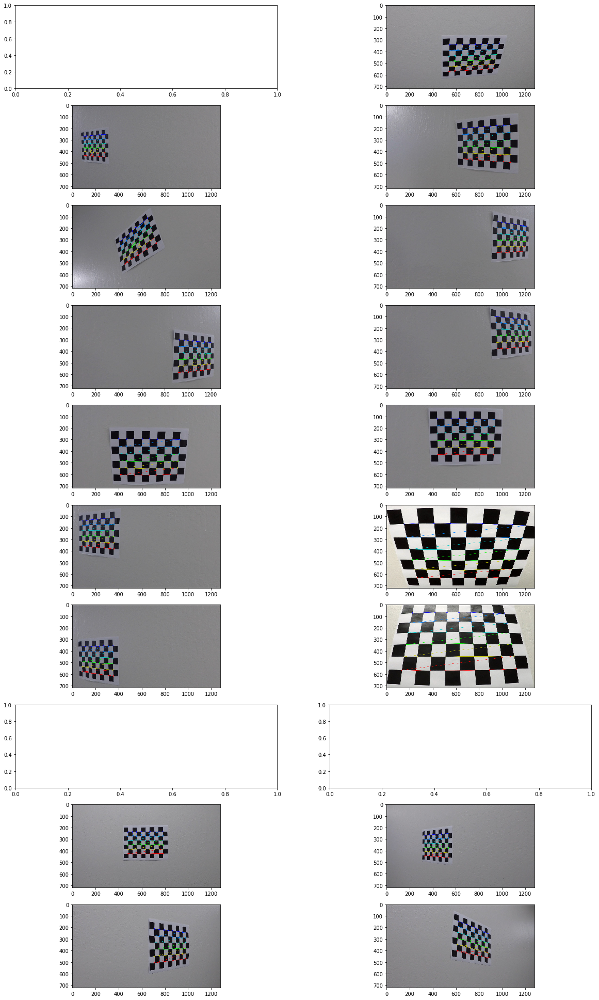

In [2]:
# Finding Corners
%matplotlib inline
# Prepare object points
nx = 9
ny = 6

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Arrays to store object points and image points from the images
objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

# Prep object points
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2) # x,y coordinates

fig, ax = plt.subplots(10,2, figsize = (20, 35))
ax = ax.ravel()

# Step through each image in the calibration set
for n, fname in enumerate(images):
    # read in each image
    img = mpimg.imread(fname)
    # convert to grayscaele
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    # If corners are found, add object points, image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        ax[n].imshow(img)
        #cv2.imwrite("output_images/corners_" + fname, img)

<center>The corners of 3 calibration images were unable to be found and in turn not displayed.</center>

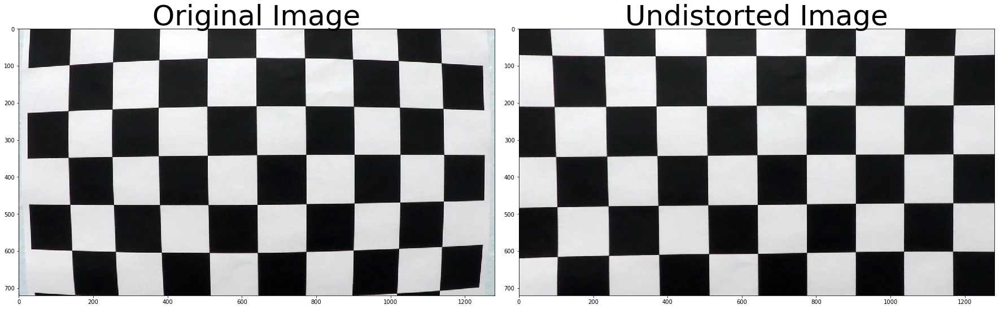

In [3]:
# Use the results obtained above to undistort an image
img = cv2.imread('./camera_cal/calibration1.jpg')

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
undistort = cv2.undistort(img, mtx, dist, None, mtx)

'''
def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

undistorted = cal_undistort(img, objpoints, imgpoints)
'''
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistort)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#cv2.imwrite("output_images/undistorted_" + fname, undistorted)

## Distortion Correction Example

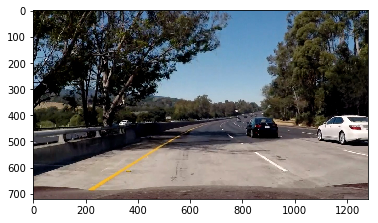

In [4]:
# Chose an image to use as an example
example = cv2.imread('./test_images/test5.jpg')
example = cv2.cvtColor(example, cv2.COLOR_BGR2RGB)
plt.imshow(example)

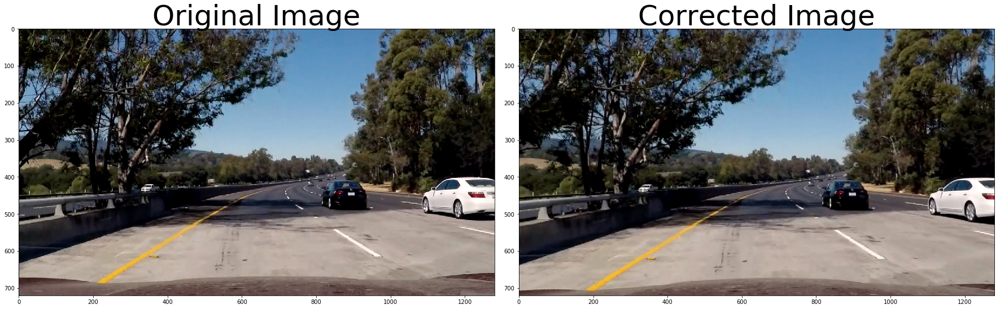

In [5]:
# Function to correct distortion of images
def distortionCorrection(img):
    corrected = cv2.undistort(img, mtx, dist, None, mtx)
    return corrected

example_corrected = distortionCorrection(example)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(example)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(example_corrected)
ax2.set_title('Corrected Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

<center>The correction is easiest to see in the corners of the image, particularly the trees and car.</center>

## Color Transforms, Gradients, and other methods

### Grayscale

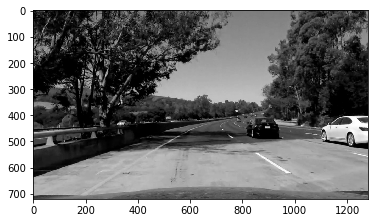

In [6]:
example_corrected_gray = cv2.cvtColor(example_corrected, cv2.COLOR_RGB2GRAY)
plt.imshow(example_corrected_gray, cmap = 'gray')

### Exploring other colorspaces - RGB

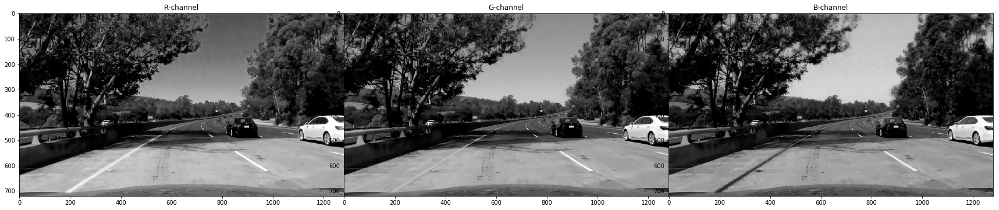

In [7]:
# RGB Color Channels

example_corrected_RGB_R, example_corrected_RGB_G, example_corrected_RGB_B = cv2.split(example_corrected)

fig, ax = plt.subplots(1,3, figsize = (30,15))
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(example_corrected_RGB_R, cmap = 'gray')
ax[0].set_title('R-channel')
ax[1].imshow(example_corrected_RGB_G, cmap = 'gray')
ax[1].set_title('G-channel')
ax[2].imshow(example_corrected_RGB_B, cmap = 'gray')
ax[2].set_title('B-channel')

### Exploring other colorspaces - HLS

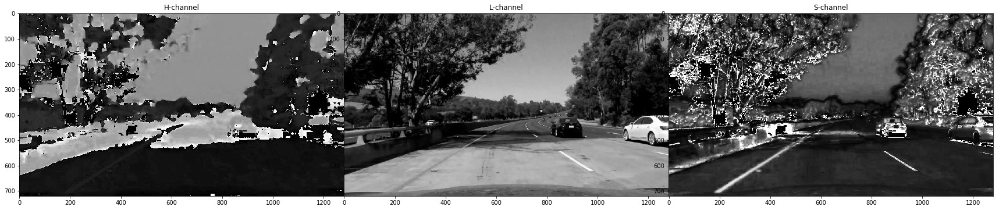

In [8]:
# HLS Color Channels
example_corrected_HLS = cv2.cvtColor(example_corrected, cv2.COLOR_RGB2HLS)

example_corrected_HLS_H, example_corrected_HLS_L, example_corrected_HLS_S = cv2.split(example_corrected_HLS)

fig, ax = plt.subplots(1,3, figsize = (30,15))
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(example_corrected_HLS_H, cmap = 'gray')
ax[0].set_title('H-channel')
ax[1].imshow(example_corrected_HLS_L, cmap = 'gray')
ax[1].set_title('L-channel')
ax[2].imshow(example_corrected_HLS_S, cmap = 'gray')
ax[2].set_title('S-channel')

### Exploring other colorspaces - HSV

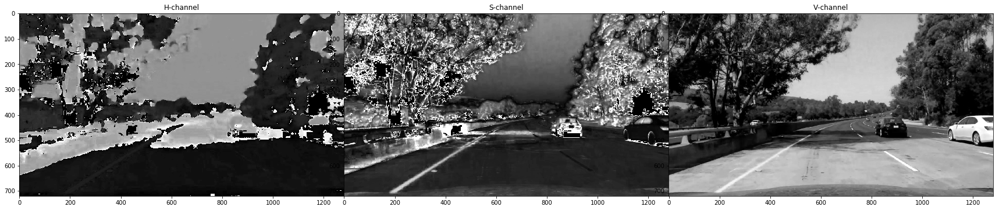

In [9]:
# HLS Color Channels
example_corrected_HSV = cv2.cvtColor(example_corrected, cv2.COLOR_RGB2HSV)

example_corrected_HSV_H, example_corrected_HSV_S, example_corrected_HSV_V = cv2.split(example_corrected_HSV)

fig, ax = plt.subplots(1, 3, figsize = (30,15))
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(example_corrected_HSV_H, cmap = 'gray')
ax[0].set_title('H-channel')
ax[1].imshow(example_corrected_HSV_S, cmap = 'gray')
ax[1].set_title('S-channel')
ax[2].imshow(example_corrected_HSV_V, cmap = 'gray')
ax[2].set_title('V-channel')

### Exploring other colorspaces - Luv

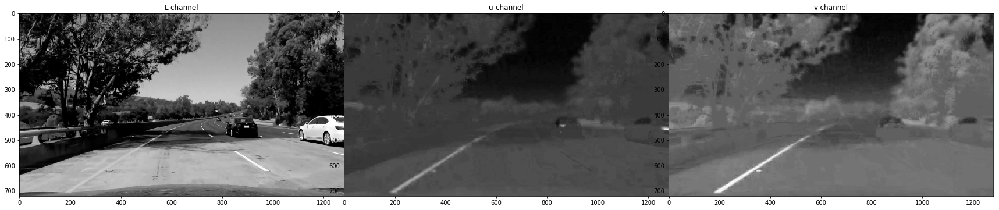

In [10]:
# Luv Color Channels
example_corrected_Luv = cv2.cvtColor(example_corrected, cv2.COLOR_RGB2Luv)

example_corrected_Luv_L, example_corrected_Luv_u, example_corrected_Luv_v = cv2.split(example_corrected_Luv)

fig, ax = plt.subplots(1,3, figsize = (30,15))
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(example_corrected_Luv_L, cmap = 'gray')
ax[0].set_title('L-channel')
ax[1].imshow(example_corrected_Luv_u, cmap = 'gray')
ax[1].set_title('u-channel')
ax[2].imshow(example_corrected_Luv_v, cmap = 'gray')
ax[2].set_title('v-channel')

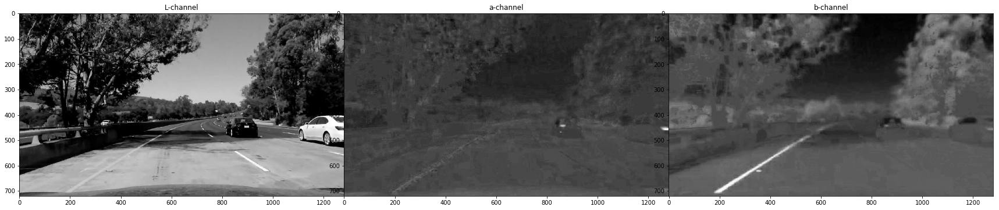

In [11]:
# Lab Color Channels
example_corrected_Lab = cv2.cvtColor(example_corrected, cv2.COLOR_RGB2Lab)

example_corrected_Lab_L, example_corrected_Lab_a, example_corrected_Lab_b = cv2.split(example_corrected_Lab)

fig, ax = plt.subplots(1,3, figsize = (30,15))
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(example_corrected_Lab_L, cmap = 'gray')
ax[0].set_title('L-channel')
ax[1].imshow(example_corrected_Lab_a, cmap = 'gray')
ax[1].set_title('a-channel')
ax[2].imshow(example_corrected_Lab_b, cmap = 'gray')
ax[2].set_title('b-channel')

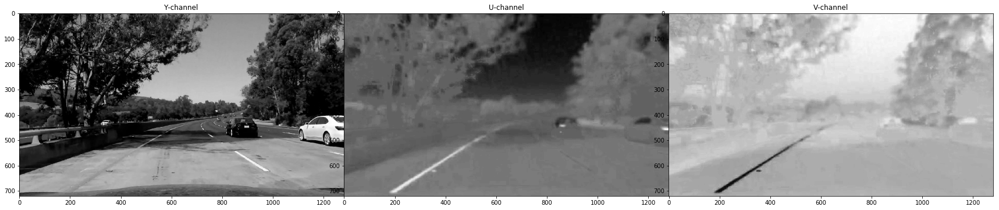

In [12]:
# HLS Color Channels
example_corrected_YUV = cv2.cvtColor(example_corrected, cv2.COLOR_RGB2YUV)

example_corrected_YUV_Y, example_corrected_YUV_U, example_corrected_YUV_V = cv2.split(example_corrected_YUV)

fig, ax = plt.subplots(1,3, figsize = (30,15))
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(example_corrected_YUV_Y, cmap = 'gray')
ax[0].set_title('Y-channel')
ax[1].imshow(example_corrected_YUV_U, cmap = 'gray')
ax[1].set_title('U-channel')
ax[2].imshow(example_corrected_YUV_V, cmap = 'gray')
ax[2].set_title('V-channel')

## Sobel Absolute Threshold

In [13]:
def abs_sobel_thresh(img, orient='x', thresh = (30, 120), chan = 0, gray = 'n'):
    if gray == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if chan > 0:
        img = img[:,:,(chan-1)]
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        img = cv2.Sobel(img, cv2.CV_64F, 1, 0)
    if orient == 'y':
        img = cv2.Sobel(img, cv2.CV_64F, 0, 1)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(img)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)

    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

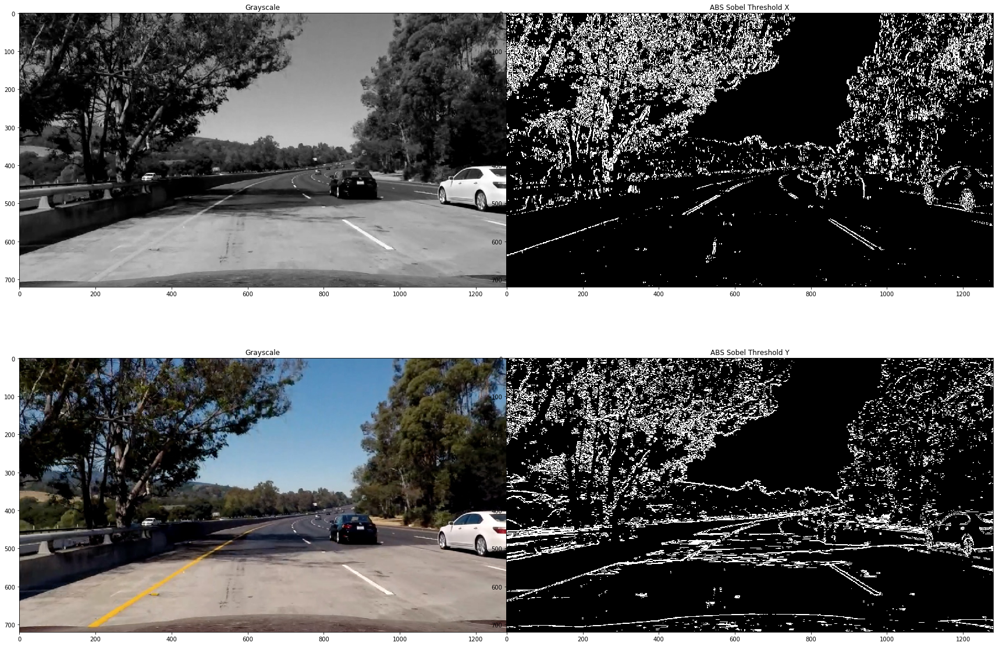

In [14]:
#example_corrected_gray = cv2.cvtColor(example_corrected, cv2.COLOR_RGB2GRAY)
abs_sobel = abs_sobel_thresh(example_corrected, 'x', (15, 80), 0, 'y')
fig, ax = plt.subplots(2,2, figsize = (30,20))
ax = ax.ravel()
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(example_corrected_gray, cmap = 'gray')
ax[0].set_title('Grayscale')
ax[1].imshow(abs_sobel, cmap = 'gray')
ax[1].set_title('ABS Sobel Threshold X')

abs_sobel = abs_sobel_thresh(example_corrected, 'y', (20, 100), 0, 'y')
ax[2].imshow(example_corrected, cmap = 'gray')
ax[2].set_title('Grayscale')
ax[3].imshow(abs_sobel, cmap = 'gray')
ax[3].set_title('ABS Sobel Threshold Y')


## Sobel Magnitude Threshold

In [15]:
def mag_thresh(img, sobel_kernel = 25, mag_thresh = (60, 200), chan = 0, gray = 'n'):
    # 1) Convert to grayscale
    if gray == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if chan > 0:
        img = img[:,:,(chan-1)]
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy)) 
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

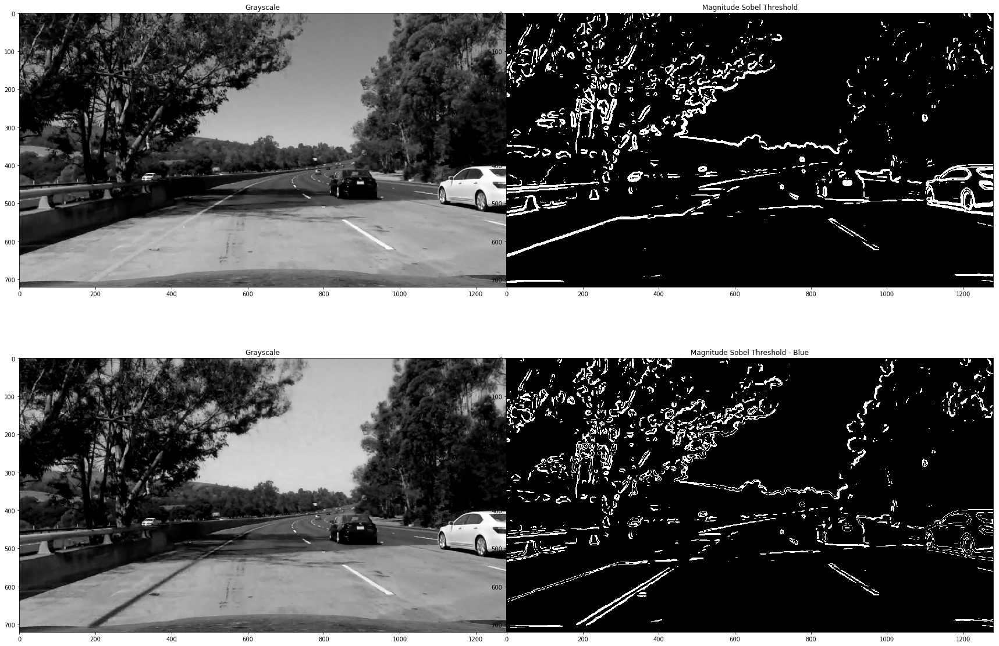

In [16]:
mag_sobel = mag_thresh(example_corrected, sobel_kernel = 25, mag_thresh = (60, 200), chan = 0, gray = 'y')
fig, ax = plt.subplots(2,2, figsize = (30,20))
ax = ax.ravel()
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(example_corrected_gray, cmap = 'gray')
ax[0].set_title('Grayscale')
ax[1].imshow(mag_sobel, cmap = 'gray')
ax[1].set_title('Magnitude Sobel Threshold')

mag_sobel = mag_thresh(example_corrected, sobel_kernel = 25, mag_thresh = (60, 100), chan = 3, gray = 'n')
ax[2].imshow(example_corrected[:,:,2], cmap = 'gray')
ax[2].set_title('Grayscale')
ax[3].imshow(mag_sobel, cmap = 'gray')
ax[3].set_title('Magnitude Sobel Threshold - Blue')

## Sobel Direction Threshold

In [17]:
def dir_thresh(img, sobel_kernel=15, mag_thresh=(0, 0.09), chan = 0, gray = 'n'):
    
    # 1) Convert to grayscale
    if gray == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if chan > 0:
        img = img[:,:,(chan-1)]
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.abs(sobelx)
    abs_sobely = np.abs(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    sobel_dir = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(sobel_dir)
    binary_output[(sobel_dir >= mag_thresh[0]) & (sobel_dir <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

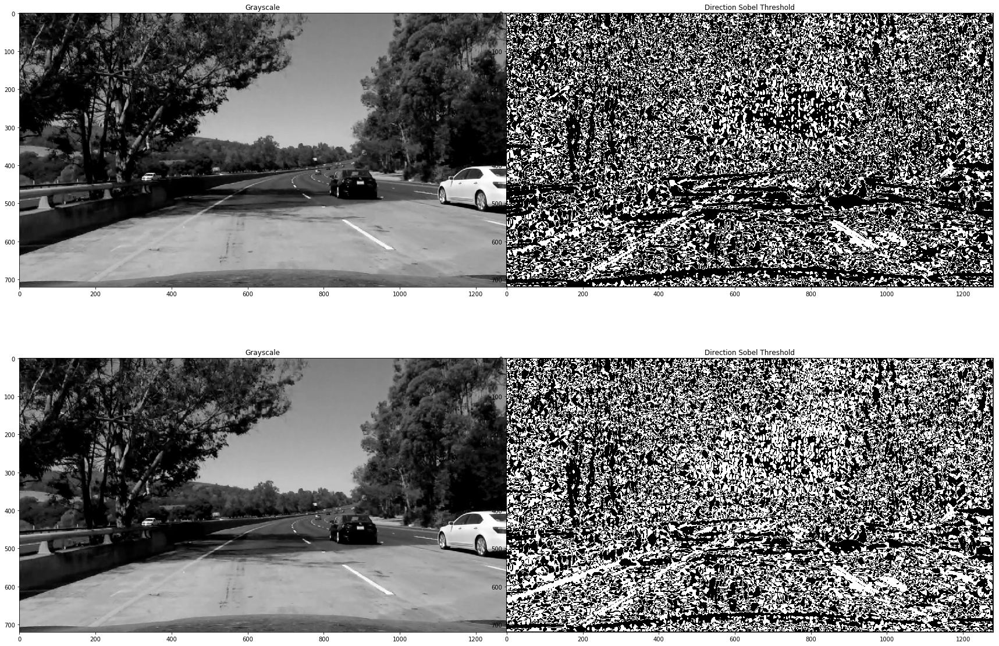

In [18]:
dir_sobel = dir_thresh(example_corrected, sobel_kernel = 25, mag_thresh = (0.7, 1.3), chan = 0, gray = 'y')
fig, ax = plt.subplots(2,2, figsize = (30,20))
ax = ax.ravel()
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(example_corrected_gray, cmap = 'gray')
ax[0].set_title('Grayscale')
ax[1].imshow(dir_sobel, cmap = 'gray')
ax[1].set_title('Direction Sobel Threshold')

dir_sobel = dir_thresh(example_corrected, sobel_kernel = 25, mag_thresh = (0.7, 1.4), chan = 0, gray = 'y')
ax[2].imshow(example_corrected_gray, cmap = 'gray')
ax[2].set_title('Grayscale')
ax[3].imshow(dir_sobel, cmap = 'gray')
ax[3].set_title('Direction Sobel Threshold')



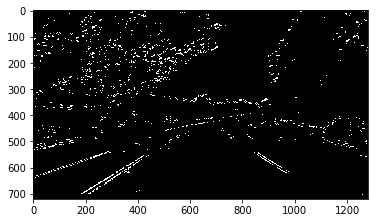

In [19]:
combined_md = np.zeros_like(mag_sobel)
combined_md[((mag_sobel == 1) & (dir_sobel == 1))] = 1
plt.imshow(combined_md, cmap = 'gray')

## Image Perspective Transform

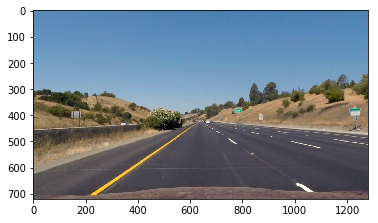

In [20]:
# Chose an image to use as an example for perspective transform
example_straight = cv2.imread('./test_images/straight_lines1.jpg')
example_straight = cv2.cvtColor(example_straight, cv2.COLOR_BGR2RGB)
example_straight_corrected = distortionCorrection(example_straight)
plt.imshow(example_straight_corrected)

ex_image = example_straight_corrected

In [21]:
def unwarp(img, src, dst):
    h,w = img.shape[:2]
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped, M, Minv

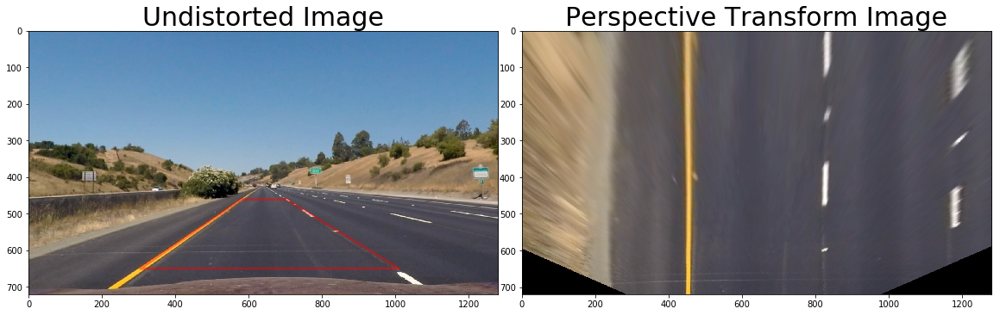

In [22]:
h,w = ex_image.shape[:2]

# define source and destination points for transform
src = np.float32([(580,461),
                  (702,461), 
                  (305,650), 
                  (1010,650)])
dst = np.float32([(450,0),
                  (w-450,0),
                  (450,h),
                  (w-450,h)])

ex_image_psptfm, M, Minv = unwarp(ex_image, src, dst)

# Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(ex_image)
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(x, y, color= (1, 0, 0), alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([h,0])
ax1.set_xlim([0,w])
ax1.set_title('Undistorted Image', fontsize=30)
ax2.imshow(ex_image_psptfm)
ax2.set_title('Perspective Transform Image', fontsize=30)

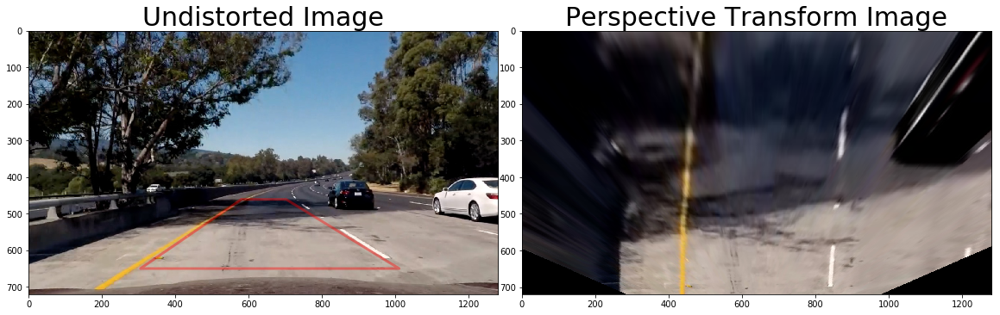

In [23]:
example_corrected_psptfm, M, Minv = unwarp(example_corrected, src, dst)

# Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(example_corrected)
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(x, y, color= (1, 0, 0), alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([h,0])
ax1.set_xlim([0,w])
ax1.set_title('Undistorted Image', fontsize=30)
ax2.imshow(example_corrected_psptfm)
ax2.set_title('Perspective Transform Image', fontsize=30)

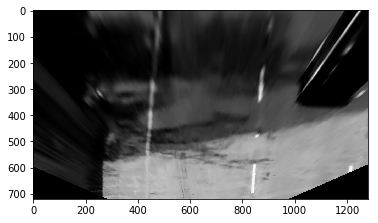

In [24]:
img_gray = cv2.cvtColor(example_corrected_psptfm, cv2.COLOR_RGB2GRAY)
plt.imshow(img_gray, cmap = 'gray')


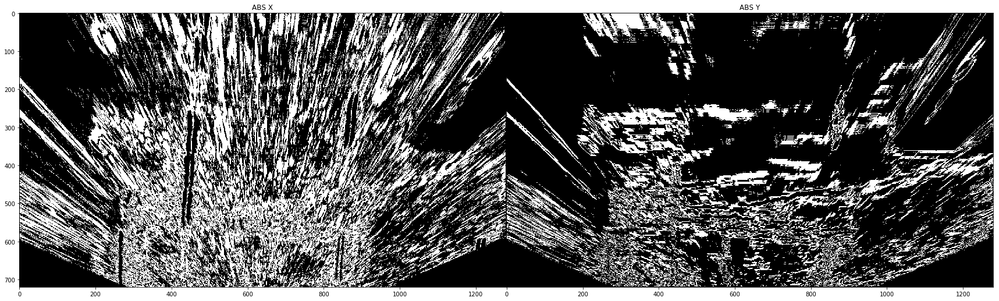

In [96]:
img_sobel_absx = abs_sobel_thresh(example_corrected_psptfm, thresh = (2,10), gray = 'y')
img_sobel_absy = abs_sobel_thresh(example_corrected_psptfm, 'y', thresh = (2,5), gray = 'y')
fig, ax = plt.subplots(1,2, figsize = (30,20))
ax = ax.ravel()
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(img_sobel_absx, cmap = 'gray')
ax[0].set_title('ABS X')
ax[1].imshow(img_sobel_absy, cmap = 'gray')
ax[1].set_title('ABS Y')


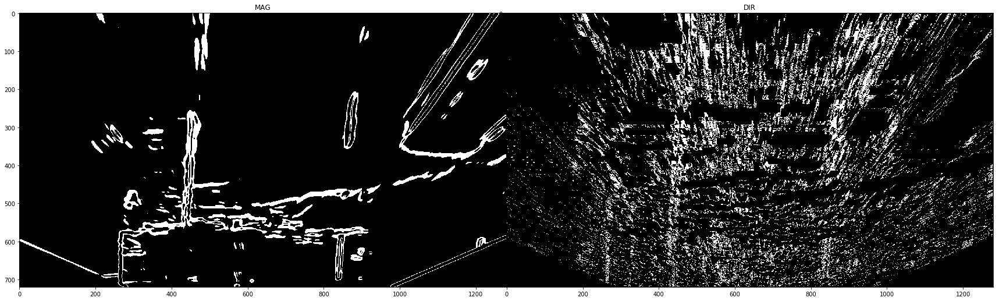

In [26]:
img_sobel_mag = mag_thresh(example_corrected_psptfm, mag_thresh = (20,50), gray = 'y')
img_sobel_dir = dir_thresh(example_corrected_psptfm, 5, mag_thresh=(0.1, 0.4), gray = 'y')
fig, ax = plt.subplots(1,2, figsize = (30,20))
ax = ax.ravel()
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(img_sobel_mag, cmap = 'gray')
ax[0].set_title('MAG')
ax[1].imshow(img_sobel_dir, cmap = 'gray')
ax[1].set_title('DIR')

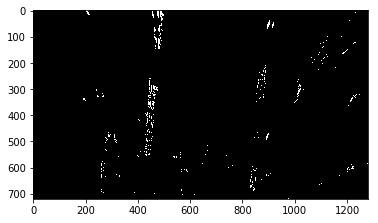

In [27]:
combined = np.zeros_like(img_sobel_mag)
combined[((img_sobel_mag == 1) & (img_sobel_dir == 1))] = 1
#combined2 = np.zeros_like(hls_s)
#combined2[((hls_l == 1) & (hls_s == 1))] = 1
#combined3 = np.zeros_like(hls_s)
#combined3[((combined == 1) | (combined2 == 1))] = 1
plt.imshow(combined, cmap = 'gray')

In [52]:
def apply_thresh(img, thresh = (0, 255)):
    binary_out = np.zeros_like(img)
    binary_out[(img >= thresh[0])&(img <= thresh[1])] = 1
    return binary_out

In [53]:
def rgb_r_thresh(img, thresh = (170, 255), chsel = 'n'):
    if chsel == 'y':
        img = img[:,:,0]
    return apply_thresh(img, thresh)

def rgb_g_thresh(img, thresh = (220, 255), chsel = 'n'):
    if chsel == 'y':
        img = img[:,:,1]
    return apply_thresh(img, thresh)

def rgb_b_thresh(img, thresh = (15, 100), chsel = 'n'):
    if chsel == 'y':
        img = img[:,:,2]
    return apply_thresh(img, thresh)


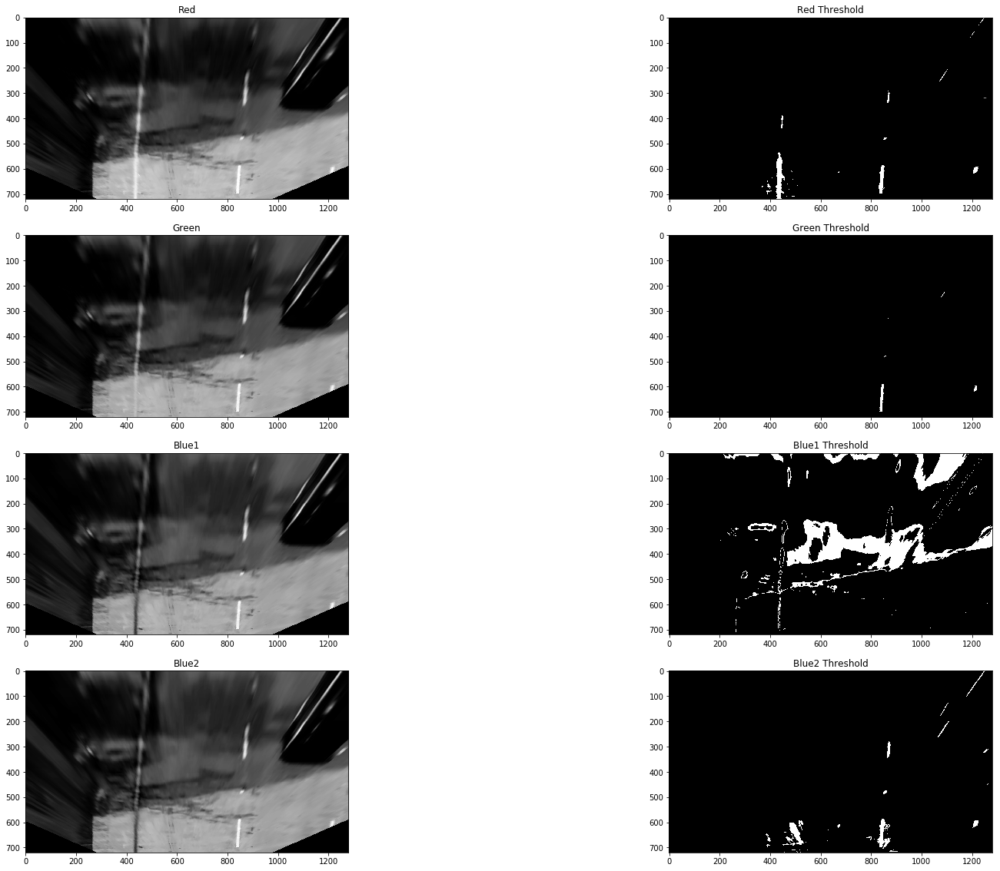

In [54]:
img = example_corrected_psptfm
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
rgb_r = rgb_r_thresh(img, thresh = (200, 255), chsel = 'y')
rgb_g = rgb_g_thresh(img, thresh = (220, 255), chsel = 'y')
rgb_b1 = rgb_b_thresh(img, thresh = (70, 85), chsel = 'y')
rgb_b2 = rgb_b_thresh(img, thresh = (170, 255), chsel = 'y')
fig, ax = plt.subplots(4,2, figsize = (30,20))
ax = ax.ravel()
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(img[:,:,0], cmap = 'gray')
ax[0].set_title('Red')
ax[1].imshow(rgb_r, cmap = 'gray')
ax[1].set_title('Red Threshold')
ax[2].imshow(img[:,:,1], cmap = 'gray')
ax[2].set_title('Green')
ax[3].imshow(rgb_g, cmap = 'gray')
ax[3].set_title('Green Threshold')
ax[4].imshow(img[:,:,2], cmap = 'gray')
ax[4].set_title('Blue1')
ax[5].imshow(rgb_b1, cmap = 'gray')
ax[5].set_title('Blue1 Threshold')
ax[6].imshow(img[:,:,2], cmap = 'gray')
ax[6].set_title('Blue2')
ax[7].imshow(rgb_b2, cmap = 'gray')
ax[7].set_title('Blue2 Threshold')

In [55]:
def hls_s_thresh(img, thresh = (170, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,2]
    return apply_thresh(img, thresh)

def hls_l_thresh(img, thresh = (220, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,1]
    return apply_thresh(img, thresh)

def hls_h_thresh(img, thresh = (15, 100), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,0]
    return apply_thresh(img, thresh)

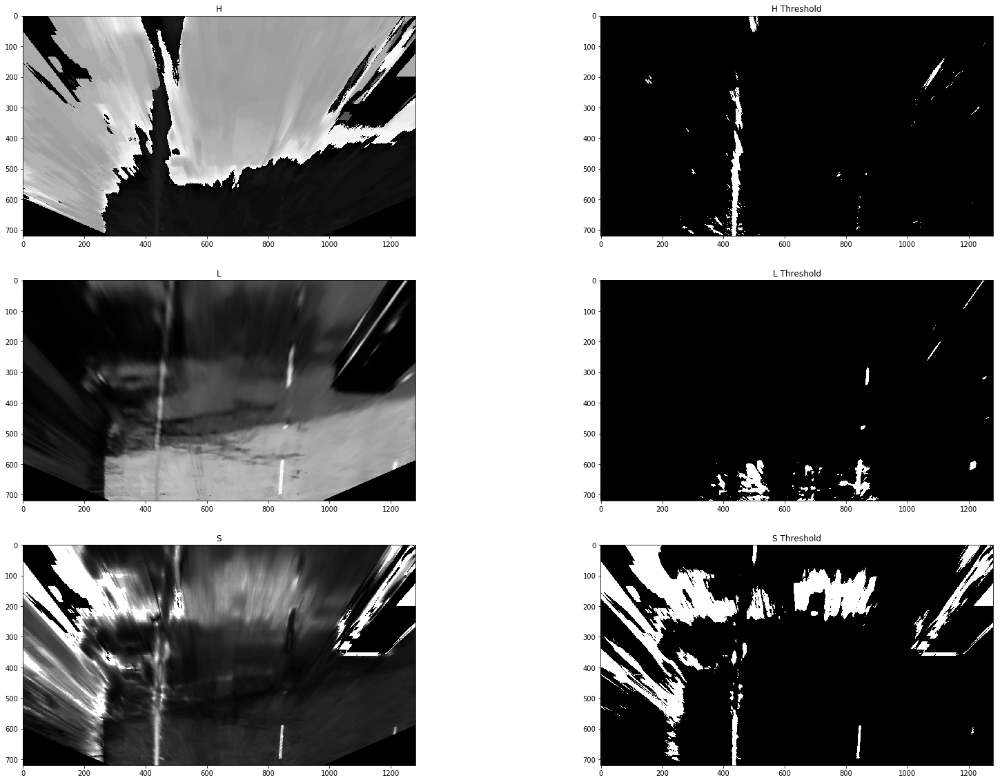

In [56]:
img_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
hls_h = hls_h_thresh(img, thresh = (17, 40), cvt = 'y')
hls_l = hls_l_thresh(img, thresh = (180, 255), cvt= 'y')
hls_s = hls_s_thresh(img, thresh = (130, 255), cvt = 'y')
fig, ax = plt.subplots(3,2, figsize = (30,20))
ax = ax.ravel()
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(img_hls[:,:,0], cmap = 'gray')
ax[0].set_title('H')
ax[1].imshow(hls_h, cmap = 'gray')
ax[1].set_title('H Threshold')
ax[2].imshow(img_hls[:,:,1], cmap = 'gray')
ax[2].set_title('L')
ax[3].imshow(hls_l, cmap = 'gray')
ax[3].set_title('L Threshold')
ax[4].imshow(img_hls[:,:,2], cmap = 'gray')
ax[4].set_title('S')
ax[5].imshow(hls_s, cmap = 'gray')
ax[5].set_title('S Threshold')

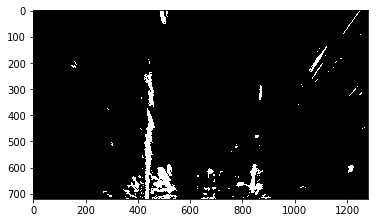

In [57]:
combined = np.zeros_like(hls_s)
combined[((hls_l == 1) | (hls_h == 1))] = 1
#combined2 = np.zeros_like(hls_s)
#combined2[((hls_l == 1) & (hls_s == 1))] = 1
#combined3 = np.zeros_like(hls_s)
#combined3[((combined == 1) | (combined2 == 1))] = 1
plt.imshow(combined, cmap = 'gray')

In [58]:
def hsv_h_thresh(img, thresh = (170, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,0]
    return apply_thresh(img, thresh)

def hsv_s_thresh(img, thresh = (220, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,1]
    return apply_thresh(img, thresh)

def hsv_v_thresh(img, thresh = (15, 100), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,2]
    return apply_thresh(img, thresh)

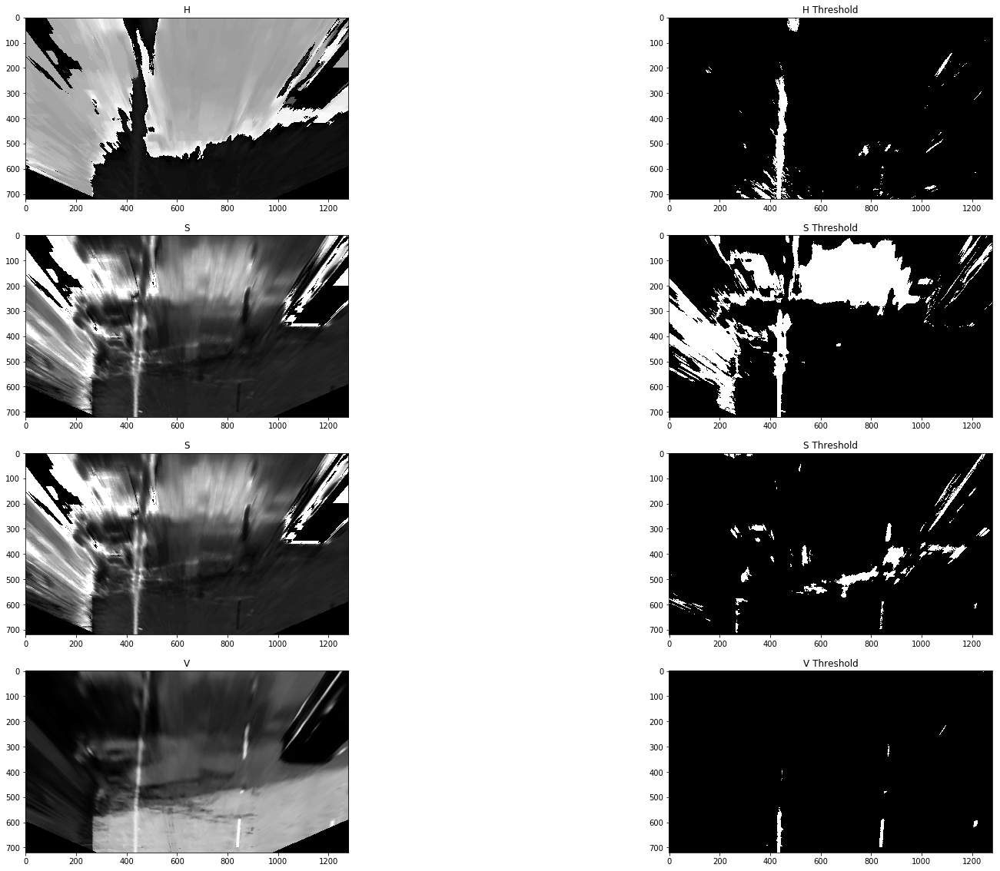

In [59]:
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
hsv_h = hsv_h_thresh(img, thresh = (15, 30), cvt = 'y')
hsv_s = hsv_s_thresh(img, thresh = (100, 250), cvt= 'y')
hsv_s2 = hsv_s_thresh(img, thresh = (0, 20), cvt= 'y')
hsv_v = hsv_v_thresh(img, thresh = (210, 255), cvt = 'y')
fig, ax = plt.subplots(4,2, figsize = (30,20))
ax = ax.ravel()
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(img_hsv[:,:,0], cmap = 'gray')
ax[0].set_title('H')
ax[1].imshow(hsv_h, cmap = 'gray')
ax[1].set_title('H Threshold')
ax[2].imshow(img_hsv[:,:,1], cmap = 'gray')
ax[2].set_title('S')
ax[3].imshow(hsv_s, cmap = 'gray')
ax[3].set_title('S Threshold')
ax[4].imshow(img_hsv[:,:,1], cmap = 'gray')
ax[4].set_title('S')
ax[5].imshow(hsv_s2, cmap = 'gray')
ax[5].set_title('S Threshold')
ax[6].imshow(img_hsv[:,:,2], cmap = 'gray')
ax[6].set_title('V')
ax[7].imshow(hsv_v, cmap = 'gray')
ax[7].set_title('V Threshold')

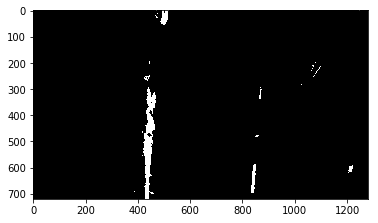

In [60]:
combined = np.zeros_like(hsv_s)
combined[((hsv_h == 1) & (hsv_s == 1))] = 1
combined2 = np.zeros_like(hsv_s)
combined2[((hsv_s == 1) & (hsv_v == 1))] = 1
combined3 = np.zeros_like(hsv_s)
combined3[((combined == 1) | (hsv_v == 1))] = 1
plt.imshow(combined3, cmap = 'gray')

In [61]:
def luv_l_thresh(img, thresh = (165, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,0]
    return apply_thresh(img, thresh)

def luv_u_thresh(img, thresh = (165, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,1]
    return apply_thresh(img, thresh)

def luv_v_thresh(img, thresh = (165, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,2]
    return apply_thresh(img, thresh)


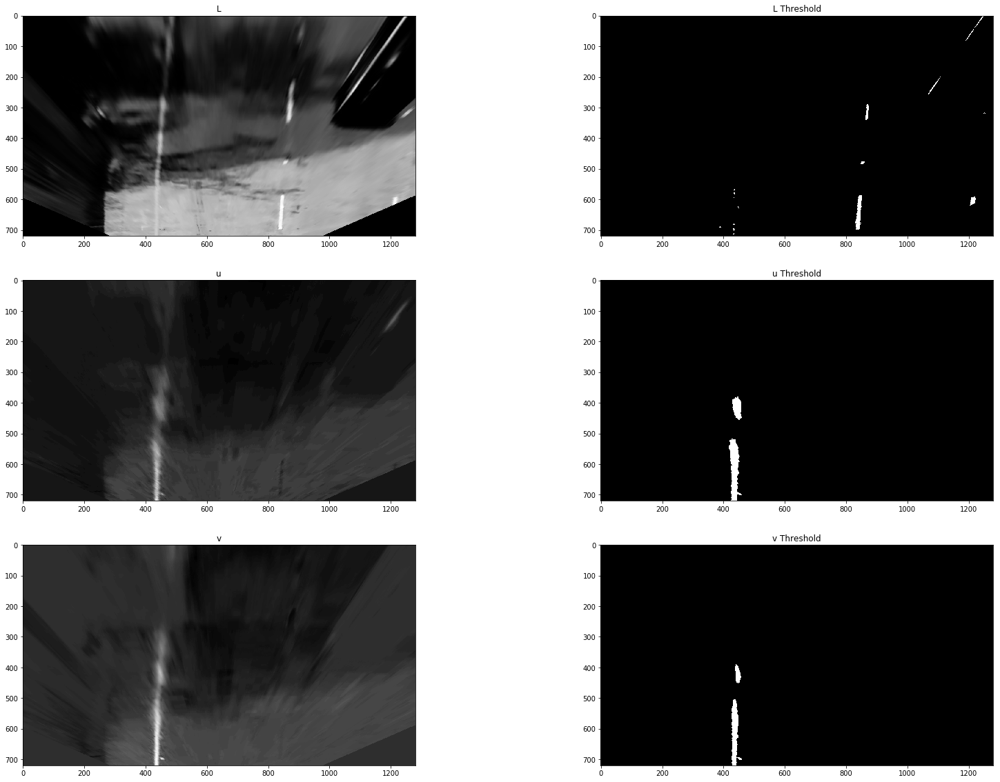

In [62]:
img_luv = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)
luv_l = luv_l_thresh(img, thresh = (200, 255), cvt = 'y')
luv_u = luv_u_thresh(img, thresh = (110, 255), cvt= 'y')
luv_v = luv_v_thresh(img, thresh = (170, 255), cvt = 'y')
fig, ax = plt.subplots(3,2, figsize = (30,20))
ax = ax.ravel()
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(img_luv[:,:,0], cmap = 'gray')
ax[0].set_title('L')
ax[1].imshow(luv_l, cmap = 'gray')
ax[1].set_title('L Threshold')
ax[2].imshow(img_luv[:,:,1], cmap = 'gray')
ax[2].set_title('u')
ax[3].imshow(luv_u, cmap = 'gray')
ax[3].set_title('u Threshold')
ax[4].imshow(img_luv[:,:,2], cmap = 'gray')
ax[4].set_title('v')
ax[5].imshow(luv_v, cmap = 'gray')
ax[5].set_title('v Threshold')

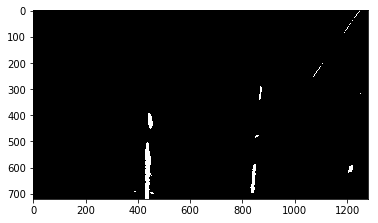

In [63]:
combined = np.zeros_like(luv_l)
combined[((luv_l == 1) | (luv_v == 1))] = 1
#combined2 = np.zeros_like(luv_u)
#combined2[((hsv_s == 1) & (hsv_v == 1))] = 1
#combined3 = np.zeros_like(luv_v)
#combined3[((combined == 1) | (hsv_v == 1))] = 1
plt.imshow(combined, cmap = 'gray')

In [64]:
def lab_l_thresh(img, thresh = (165, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,0]
    return apply_thresh(img, thresh)

def lab_a_thresh(img, thresh = (165, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,1]
    return apply_thresh(img, thresh)

def lab_b_thresh(img, thresh = (165, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,2]
    return apply_thresh(img, thresh)


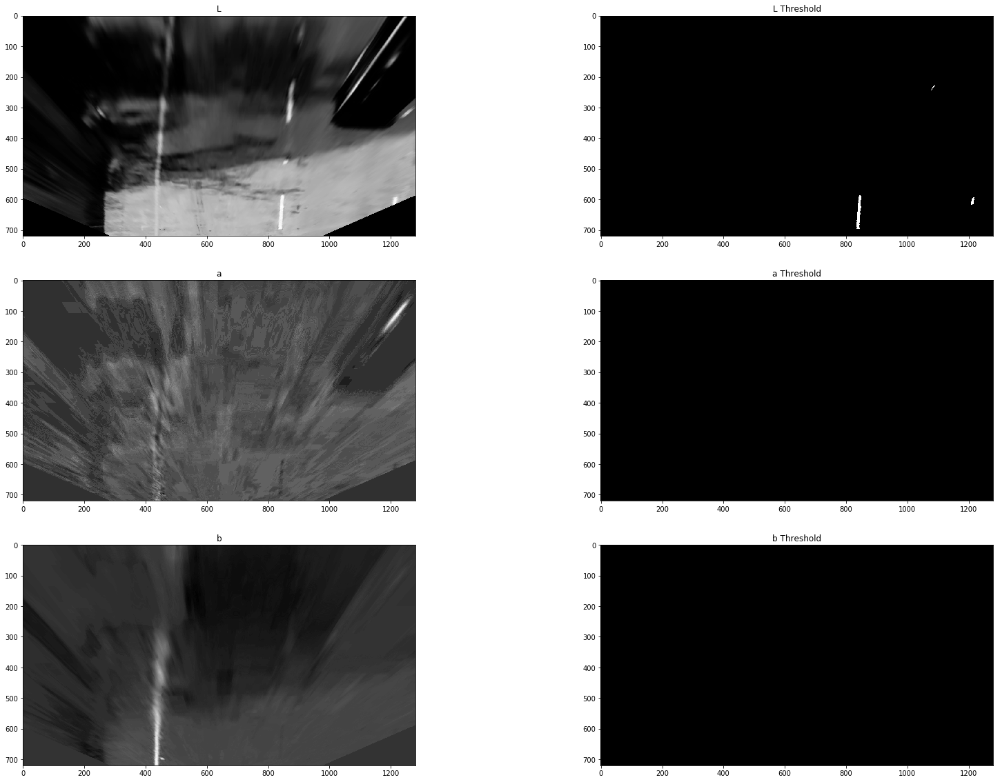

In [65]:
img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
lab_l = lab_l_thresh(img, thresh = (230, 255), cvt = 'y')
lab_a = lab_a_thresh(img, thresh = (0, 90), cvt= 'y')
lab_b = lab_b_thresh(img, thresh = (0, 255), cvt = 'y')
fig, ax = plt.subplots(3,2, figsize = (30,20))
ax = ax.ravel()
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(img_lab[:,:,0], cmap = 'gray')
ax[0].set_title('L')
ax[1].imshow(lab_l, cmap = 'gray')
ax[1].set_title('L Threshold')
ax[2].imshow(img_lab[:,:,1], cmap = 'gray')
ax[2].set_title('a')
ax[3].imshow(lab_a, cmap = 'gray')
ax[3].set_title('a Threshold')
ax[4].imshow(img_lab[:,:,2], cmap = 'gray')
ax[4].set_title('b')
ax[5].imshow(lab_b, cmap = 'gray')
ax[5].set_title('b Threshold')

In [66]:
def yuv_y_thresh(img, thresh = (165, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,0]
    return apply_thresh(img, thresh)

def yuv_u_thresh(img, thresh = (165, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,1]
    return apply_thresh(img, thresh)

def yuv_v_thresh(img, thresh = (165, 255), cvt = 'n', chsel = 'n'):
    if cvt == 'y':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    if cvt == 'y' or chsel == 'y':
        img = img[:,:,2]
    return apply_thresh(img, thresh)


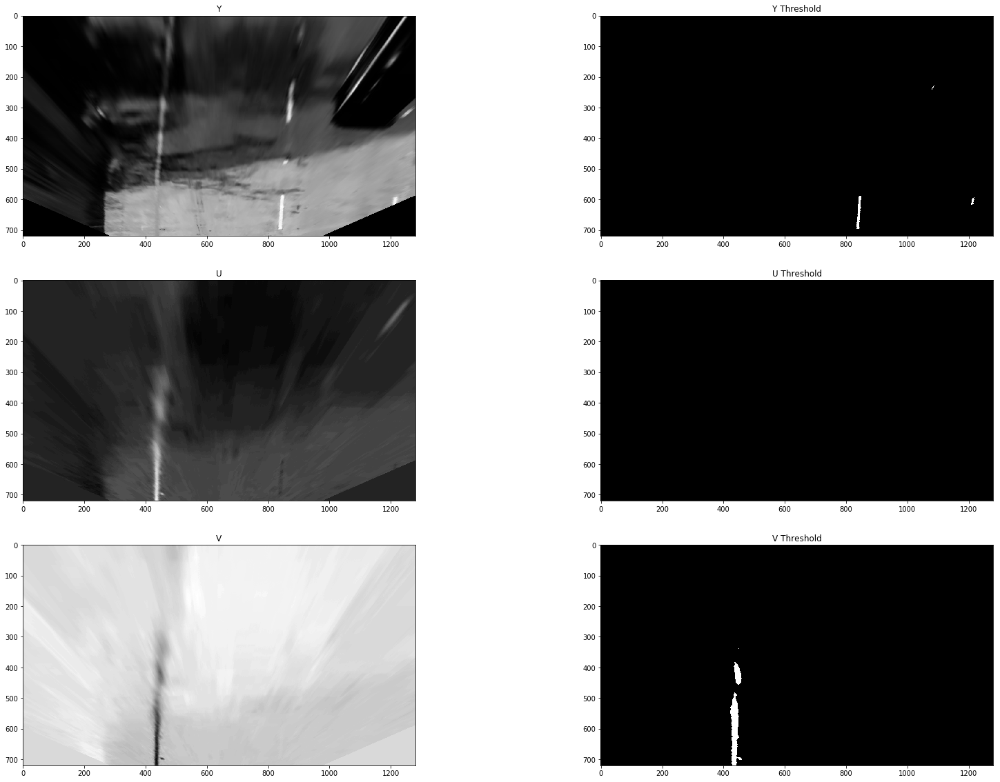

In [67]:
img_yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
yuv_y = yuv_y_thresh(img, thresh = (230, 255), cvt = 'y')
yuv_u = yuv_u_thresh(img, thresh = (0, 255), cvt= 'y')
yuv_v = yuv_v_thresh(img, thresh = (0, 100), cvt = 'y')
fig, ax = plt.subplots(3,2, figsize = (30,20))
ax = ax.ravel()
fig.subplots_adjust(hspace = .2, wspace=.001)
ax[0].imshow(img_yuv[:,:,0], cmap = 'gray')
ax[0].set_title('Y')
ax[1].imshow(yuv_y, cmap = 'gray')
ax[1].set_title('Y Threshold')
ax[2].imshow(img_yuv[:,:,1], cmap = 'gray')
ax[2].set_title('U')
ax[3].imshow(yuv_u, cmap = 'gray')
ax[3].set_title('U Threshold')
ax[4].imshow(img_yuv[:,:,2], cmap = 'gray')
ax[4].set_title('V')
ax[5].imshow(yuv_v, cmap = 'gray')
ax[5].set_title('V Threshold')

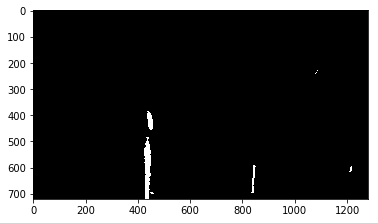

In [68]:
combined = np.zeros_like(yuv_y)
combined[((yuv_y == 1) | (yuv_v == 1))] = 1
#combined2 = np.zeros_like(luv_u)
#combined2[((hsv_s == 1) & (hsv_v == 1))] = 1
#combined3 = np.zeros_like(luv_v)
#combined3[((combined == 1) | (hsv_v == 1))] = 1
plt.imshow(combined, cmap = 'gray')

## Image Processing Pipe

In [69]:
def pipeline(img):
    img_dist_cor = distortionCorrection(img)
    
    img_persp_trans, M, Minv = unwarp(img, src, dst)
    
    #img_sob_abs_x = abs_sobel_thresh(img_persp_trans, gray = 'y')
    #img_sob_abs_y = abs_sobel_thresh(img_persp_trans, 'y', gray = 'y')
    #img_sob_mag = mag_thresh(img_persp_trans, sobel_kernel = 25, mag_thresh = (60, 100), chan = 3, gray = 'y')
    #img_sob_dir = dir_thresh(img_persp_trans, sobel_kernel = 25, mag_thresh = (0.7, 1.3), chan = 0, gray = 'y')
    
    img_rgb_r_thresh = rgb_r_thresh(img_persp_trans, thresh = (225, 255), chsel = 'y')
    #img_rgb_g_thresh = rgb_g_thresh(img_persp_trans, thresh = (220, 255), chsel = 'y')
    #img_rgb_b_thresh = rgb_b_thresh(img_persp_trans, thresh = (60, 90), chsel = 'y')
    #return img_persp_trans, img_rgb_r_thresh, Minv
 #   return img_rgb_r_thresh, Minv
    
####    img_hls_h_thresh = hls_h_thresh(img_persp_trans, thresh = (17, 30), cvt = 'y')
####    img_hls_l_thresh = hls_l_thresh(img_persp_trans, thresh = (220, 255), cvt= 'y')
#    img_hls_s_thresh = hls_s_thresh(img_persp_trans, thresh = (70, 255), cvt = 'y')
#    return img_hls_h_thresh, Minv
####    combined = np.zeros_like(img_hls_l_thresh)
####    combined[((img_rgb_r_thresh == 1)&(img_hls_h_thresh == 1))] = 1
#    return combined, Minv
####    combined2 = np.zeros_like(img_hls_l_thresh)
####    combined2[((combined == 1)|(img_hls_l_thresh == 1))] = 1
####    return combined2, Minv

    
#    combined_hls = np.zeros_like(img_hls_h_thresh)
#    combined_hls[((img_hls_h_thresh == 1) & (img_hls_s_thresh == 1))] = 1
    #return img_persp_trans, combined_hls, Minv
#    combined2_hls = np.zeros_like(img_hls_h_thresh)
#    combined2_hls[((img_hls_l_thresh == 1) & (img_hls_s_thresh == 1))] = 1
    #return img_persp_trans, combined2_hls, Minv
#    combined3_hls = np.zeros_like(img_hls_h_thresh)
#    combined3_hls[((combined_hls == 1) | (combined2_hls == 1))] = 1
    #return img_persp_trans, combined3_hls, Minv
    
#    img_hsv_h_thresh = hsv_h_thresh(img_persp_trans, thresh = (15, 50), cvt = 'y')
#    img_hsv_s_thresh = hsv_s_thresh(img_persp_trans, thresh = (0, 25), cvt= 'y')
#    img_hsv_v_thresh = hsv_v_thresh(img_persp_trans, thresh = (200, 255), cvt = 'y')
    
#    combined_hsv = np.zeros_like(img_hsv_h_thresh)
#    combined_hsv[((img_hsv_h_thresh == 1) & (img_hsv_v_thresh == 1))] = 1
    #return img_persp_trans, combined_hsv, Minv
#    combined2_hsv = np.zeros_like(img_hsv_h_thresh)
#    combined2_hsv[((img_hsv_s_thresh == 1) & (img_hsv_v_thresh == 1))] = 1
    #return img_persp_trans, combined2_hsv, Minv
#    combined3_hsv = np.zeros_like(img_hsv_h_thresh)
#    combined3_hsv[((combined_hsv == 1) | (combined2_hsv == 1))] = 1
    #return img_persp_trans, combined3_hsv, Minv
    
    img_luv_l_thresh = luv_l_thresh(img_persp_trans, thresh = (200, 255), cvt = 'y')
#    img_luv_u_thresh = luv_u_thresh(img_persp_trans, thresh = (110, 255), cvt= 'y')
    img_luv_v_thresh = luv_v_thresh(img_persp_trans, thresh = (170, 255), cvt = 'y')
    
    combined3 = np.zeros_like(img_luv_v_thresh)
    combined3[((img_luv_v_thresh == 1)|(img_luv_l_thresh == 1))] = 1
####    return combined3, Minv
    
#    combined_luv = np.zeros_like(img_luv_l_thresh)
    #combined_luv[((img_luv_l_thresh == 1)|(img_luv_u_thresh == 1)|(img_luv_v_thresh == 1))] = 1
#    combined_luv[((img_luv_l_thresh == 1)|(img_luv_u_thresh == 1)|(img_luv_v_thresh == 1))] = 1
    #return img_persp_trans, combined_luv, Minv
    
#    img_lab_l_thresh = lab_l_thresh(img_persp_trans, thresh = (210, 255), cvt = 'y')
    #img_lab_a_thresh = lab_a_thresh(img_persp_trans, thresh = (110, 255), cvt= 'y')
#    img_lab_b_thresh = lab_b_thresh(img_persp_trans, thresh = (160, 255), cvt = 'y')
    #return img_lab_b_thresh, Minv
    
#    combined_lab = np.zeros_like(img_lab_l_thresh)
#    combined_lab[((img_lab_l_thresh == 1)|(img_lab_b_thresh == 1))] = 1
    #return img_persp_trans, combined_lab, Minv
  #  return combined_lab, Minv
    
    img_yuv_y_thresh = yuv_y_thresh(img_persp_trans, thresh = (230, 255), cvt = 'y')
    #img_yuv_u_thresh = yuv_u_thresh(img_persp_trans, thresh = (0, 255), cvt= 'y')
    img_yuv_v_thresh = yuv_v_thresh(img_persp_trans, thresh = (0, 100), cvt = 'y')
    
    img_yuv_y_thresh = yuv_y_thresh(img_persp_trans, thresh = (230, 255), cvt = 'y')
    yuv_u = yuv_u_thresh(img, thresh = (0, 255), cvt= 'y')
    yuv_v = yuv_v_thresh(img, thresh = (0, 100), cvt = 'y')
    
    combined_yuv = np.zeros_like(img_yuv_y_thresh)
    combined_yuv[((img_yuv_y_thresh == 1)|(img_yuv_v_thresh == 1))] = 1
    combined_yuv_r = np.zeros_like(img_yuv_y_thresh)
    combined_yuv_r[((combined_yuv == 1) & (img_rgb_r_thresh == 1) | (combined3 == 1))] = 1
    #return img_persp_trans, combined_yuv, Minv
    return combined_yuv, Minv
    
    output = np.zeros_like(img_rgb_r_thresh)
    #output[((img_hls_l_thresh == 1)|(img_lab_b_thresh == 1))] == 1
    #output[((img_rgb_r_thresh == 1)|(combined_lab == 1)|(combined_yuv == 1))] = 1
    output[((img_rgb_r_thresh == 1)|(combined2_hls == 1)|(combined2_hsv == 1)|(combined_luv == 1)|(combined_lab == 1)|(combined_yuv == 1))] = 1

    #return output, Minv
    return img_persp_trans, output, Minv

def pipeline2(img):
    img_dist_cor = distortionCorrection(img)
    
    img_persp_trans, M, Minv = unwarp(img, src, dst)
    
    img_yuv_y_thresh = yuv_y_thresh(img_persp_trans, thresh = (180, 255), cvt = 'y')
    #img_yuv_u_thresh = yuv_u_thresh(img_persp_trans, thresh = (0, 255), cvt= 'y')
    img_yuv_v_thresh = yuv_v_thresh(img_persp_trans, thresh = (0, 115), cvt = 'y')
    
    combined_yuv = np.zeros_like(img_yuv_y_thresh)
    combined_yuv[((img_yuv_y_thresh == 1)|(img_yuv_v_thresh == 1))] = 1
    #return img_persp_trans, combined_yuv, Minv
    return combined_yuv, Minv

#lab_l, yuv_y, yuv_v, luv_l, luv_v

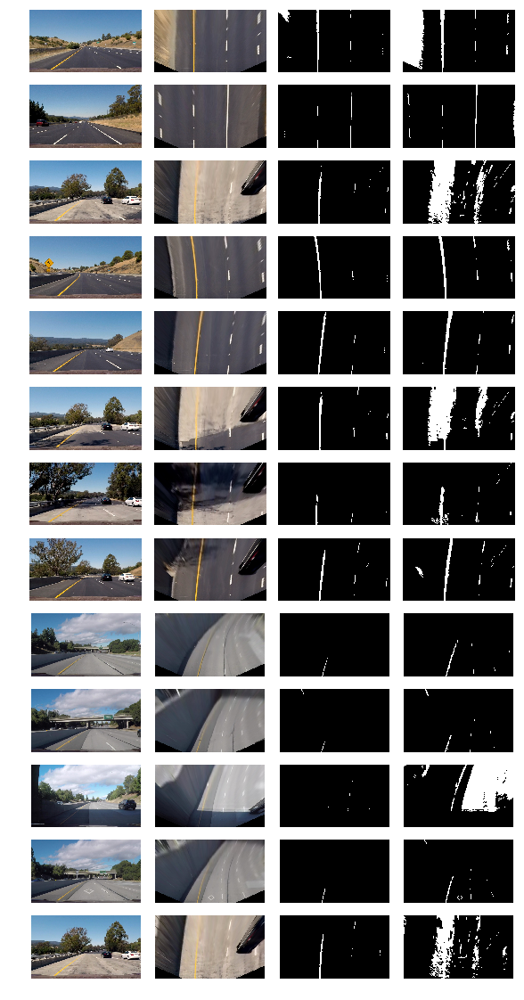

In [94]:
# Make a list of example images
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),4, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    imge = cv2.imread(image)
    imge = cv2.cvtColor(imge, cv2.COLOR_BGR2RGB)
    img_persp_trans, M, Minv = unwarp(imge, src, dst)
    img_bin, Minv = pipeline(imge)
    img_bin2, Minv = pipeline2(imge)
    axs[i].imshow(imge)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(img_persp_trans, cmap='gray')
    axs[i].axis('off')
    i += 1
    axs[i].imshow(img_bin, cmap='gray')
    axs[i].axis('off')
    i += 1
    axs[i].imshow(img_bin2, cmap='gray')
    axs[i].axis('off')
    i += 1


## Sliding Window Polyfit

In [ ]:
# Define method to fit polynomial to binary image with lines extracted, using sliding window
def sliding_window_polyfit(img):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    quarter_point = np.int(midpoint//2)
    # Previously the left/right base was the max of the left/right half of the histogram
    # this changes it so that only a quarter of the histogram (directly to the left/right) is considered
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
    
    #print('base pts:', leftx_base, rightx_base)

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    visualization_data = (rectangle_data, histogram)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data
print('...')

In [ ]:
# visualize the result on example image
exampleImg = cv2.imread('./test_images/test6.jpg')
exampleImg = cv2.cvtColor(exampleImg, cv2.COLOR_BGR2RGB)
exampleImg_bin, Minv = pipeline(exampleImg)
    
left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window_polyfit(exampleImg_bin)

if left_fit is None:
    exampleImg_bin, Minv = pipeline2(exampleImg)
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window_polyfit(exampleImg_bin)

h = exampleImg.shape[0]
left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
#print('fit x-intercepts:', left_fit_x_int, right_fit_x_int)

rectangles = visualization_data[0]
histogram = visualization_data[1]

# Create an output image to draw on and  visualize the result
out_img = np.uint8(np.dstack((exampleImg_bin, exampleImg_bin, exampleImg_bin))*255)
# Generate x and y values for plotting
ploty = np.linspace(0, exampleImg_bin.shape[0]-1, exampleImg_bin.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
for rect in rectangles:
# Draw the windows on the visualization image
    cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
    cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
# Identify the x and y positions of all nonzero pixels in the image
nonzero = exampleImg_bin.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

print('...')

In [ ]:
# Print histogram from sliding window polyfit for example image
plt.plot(histogram)
plt.xlim(0, 1280)
print('...')

In [ ]:
# Define method to fit polynomial to binary image based upon a previous fit (chronologically speaking);
# this assumes that the fit will not change significantly from one video frame to the next
def polyfit_using_prev_fit(binary_warped, left_fit_prev, right_fit_prev):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds
print('...')

In [ ]:
# visualize the result on example image
exampleImg2 = cv2.imread('./test_images/test5.jpg')
exampleImg2 = cv2.cvtColor(exampleImg2, cv2.COLOR_BGR2RGB)
exampleImg2_bin, Minv = pipeline(exampleImg2)   
margin = 80

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_using_prev_fit(exampleImg2_bin, left_fit, right_fit)

if left_fit2 is None:
    exampleImg2_bin, Minv = pipeline2(exampleImg2)
    left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_using_prev_fit(exampleImg2_bin, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, exampleImg2_bin.shape[0]-1, exampleImg2_bin.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((exampleImg2_bin, exampleImg2_bin, exampleImg2_bin))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = exampleImg2_bin.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area (OLD FIT)
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
print('...')

In [ ]:
# Method to determine radius of curvature and distance from lane center 
# based on binary image, polynomial fit, and L and R lane pixel indices
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist
print('...')

In [ ]:
rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(exampleImg_bin, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')

In [ ]:
def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result
print('...')

In [ ]:
exampleImg_out1 = draw_lane(exampleImg, exampleImg_bin, left_fit, right_fit, Minv)
plt.imshow(exampleImg_out1)
print('...')

In [ ]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img
print('...')

In [ ]:
exampleImg_out2 = draw_data(exampleImg_out1, (rad_l+rad_r)/2, d_center)
plt.imshow(exampleImg_out2)
print('...')

In [ ]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)


            

print('...')

In [ ]:
def process_image(img):
    new_img = np.copy(img)
    img_bin, Minv = pipeline(new_img)
    
    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window_polyfit(img_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polyfit_using_prev_fit(img_bin, l_line.best_fit, r_line.best_fit)
        
    if l_fit is None:
        img_bin, Minv = pipeline2(new_img)
    
        # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
        if not l_line.detected or not r_line.detected:
            l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window_polyfit(img_bin)
        else:
            l_fit, r_fit, l_lane_inds, r_lane_inds = polyfit_using_prev_fit(img_bin, l_line.best_fit, r_line.best_fit)
        
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if l_fit is not None and r_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    
    # draw the current best fit if it exists
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lane(new_img, img_bin, l_line.best_fit, r_line.best_fit, Minv)
        rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(img_bin, l_line.best_fit, r_line.best_fit, 
                                                               l_lane_inds, r_lane_inds)
        img_out = draw_data(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
    
    diagnostic_output = False
    if diagnostic_output:
        # put together multi-view output
        diag_img = np.zeros((720,1280,3), dtype=np.uint8)
        
        # original output (top left)
        diag_img[0:360,0:640,:] = cv2.resize(img_out,(640,360))
        
        # binary overhead view (top right)
        img_bin = np.dstack((img_bin*255, img_bin*255, img_bin*255))
        resized_img_bin = cv2.resize(img_bin,(640,360))
        diag_img[0:360,640:1280, :] = resized_img_bin
        
        # overhead with all fits added (bottom right)
        img_bin_fit = np.copy(img_bin)
        for i, fit in enumerate(l_line.current_fit):
            img_bin_fit = plot_fit_onto_img(img_bin_fit, fit, (20*i+100,0,20*i+100))
        for i, fit in enumerate(r_line.current_fit):
            img_bin_fit = plot_fit_onto_img(img_bin_fit, fit, (0,20*i+100,20*i+100))
        img_bin_fit = plot_fit_onto_img(img_bin_fit, l_line.best_fit, (255,255,0))
        img_bin_fit = plot_fit_onto_img(img_bin_fit, r_line.best_fit, (255,255,0))
        diag_img[360:720,640:1280,:] = cv2.resize(img_bin_fit,(640,360))
        
        # diagnostic data (bottom left)
        color_ok = (200,255,155)
        color_bad = (255,155,155)
        font = cv2.FONT_HERSHEY_DUPLEX
        if l_fit is not None:
            text = 'This fit L: ' + ' {:0.6f}'.format(l_fit[0]) + \
                                    ' {:0.6f}'.format(l_fit[1]) + \
                                    ' {:0.6f}'.format(l_fit[2])
        else:
            text = 'This fit L: None'
        cv2.putText(diag_img, text, (40,380), font, .5, color_ok, 1, cv2.LINE_AA)
        if r_fit is not None:
            text = 'This fit R: ' + ' {:0.6f}'.format(r_fit[0]) + \
                                    ' {:0.6f}'.format(r_fit[1]) + \
                                    ' {:0.6f}'.format(r_fit[2])
        else:
            text = 'This fit R: None'
        cv2.putText(diag_img, text, (40,400), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Best fit L: ' + ' {:0.6f}'.format(l_line.best_fit[0]) + \
                                ' {:0.6f}'.format(l_line.best_fit[1]) + \
                                ' {:0.6f}'.format(l_line.best_fit[2])
        cv2.putText(diag_img, text, (40,440), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Best fit R: ' + ' {:0.6f}'.format(r_line.best_fit[0]) + \
                                ' {:0.6f}'.format(r_line.best_fit[1]) + \
                                ' {:0.6f}'.format(r_line.best_fit[2])
        cv2.putText(diag_img, text, (40,460), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Diffs L: ' + ' {:0.6f}'.format(l_line.diffs[0]) + \
                             ' {:0.6f}'.format(l_line.diffs[1]) + \
                             ' {:0.6f}'.format(l_line.diffs[2])
        if l_line.diffs[0] > 0.001 or \
           l_line.diffs[1] > 1.0 or \
           l_line.diffs[2] > 100.:
            diffs_color = color_bad
        else:
            diffs_color = color_ok
        cv2.putText(diag_img, text, (40,500), font, .5, diffs_color, 1, cv2.LINE_AA)
        text = 'Diffs R: ' + ' {:0.6f}'.format(r_line.diffs[0]) + \
                             ' {:0.6f}'.format(r_line.diffs[1]) + \
                             ' {:0.6f}'.format(r_line.diffs[2])
        if r_line.diffs[0] > 0.001 or \
           r_line.diffs[1] > 1.0 or \
           r_line.diffs[2] > 100.:
            diffs_color = color_bad
        else:
            diffs_color = color_ok
        cv2.putText(diag_img, text, (40,520), font, .5, diffs_color, 1, cv2.LINE_AA)
        text = 'Good fit count L:' + str(len(l_line.current_fit))
        cv2.putText(diag_img, text, (40,560), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Good fit count R:' + str(len(r_line.current_fit))
        cv2.putText(diag_img, text, (40,580), font, .5, color_ok, 1, cv2.LINE_AA)
        
        img_out = diag_img
    return img_out
print('...')

In [ ]:
def plot_fit_onto_img(img, fit, plot_color):
    if fit is None:
        return img
    new_img = np.copy(img)
    h = new_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    plotx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
    pts = np.array([np.transpose(np.vstack([plotx, ploty]))])
    cv2.polylines(new_img, np.int32([pts]), isClosed=False, color=plot_color, thickness=8)
    return new_img
print('...')

In [ ]:
from moviepy.editor import VideoFileClip

l_line = Line()
r_line = Line()
#my_clip.write_gif('test.gif', fps=12)
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')#.subclip(22,26)
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

In [ ]:
l_line = Line()
r_line = Line()
video_output2 = 'challenge_video_output.mp4'
video_input2 = VideoFileClip('challenge_video.mp4')#.subclip(10,12)
#video_input2.save_frame("challenge01.jpeg", t=0.25) # saves the frame at time = 0.25s
processed_video = video_input2.fl_image(process_image)
%time processed_video.write_videofile(video_output2, audio=False)

In [ ]:
l_line = Line()
r_line = Line()
video_output3 = 'harder_challenge_video_output.mp4'
video_input3 = VideoFileClip('harder_challenge_video.mp4')#.subclip(0,3)
#video_input3.save_frame("hard_challenge01.jpeg") # saves the first frame
processed_video = video_input3.fl_image(process_image)
%time processed_video.write_videofile(video_output3, audio=False)